# <h1><center>CodeIT AI Engineer 3기 Mission 5</center></h1>


## 문제

이번 미션에서는 손상된 문서를 복원하는 작업을 수행합니다.

오토인코더를 활용하여 문서 이미지의 품질을 향상시키고, 문서의 내용을 최대한 복원하는 모델을 구현해 봅시다.

문서는 습기, 찢김, 얼룩 등 다양한 이유로 손상될 수 있는데요. 이번 미션의 목표는 손상된 문서에서 노이즈를 제거하여 원본 문서를 최대한 복원하는 것입니다. 

아래 데이터셋을 활용하여 다양한 복원 기법을 실험해보고, 성능을 평가해 보세요.


## 데이터셋

데이터 링크:
https://www.kaggle.com/competitions/denoising-dirty-documents/data

- train: 손상된 문서(모델 훈련용)
- train_cleaned: 손상된 문서의 원본(모델 훈련용)
- test: 손상된 문서(모델 테스트용)


학습용 이미지와 테스트용 이미지, 두 세트가 제공됩니다. 

이 이미지들은 다양한 스타일의 텍스트를 포함하고 있으며, 실제 세계의 지저분한 아티팩트를 시뮬레이션하기 위해 합성 노이즈가 추가되었습니다. 

학습용 세트에는 노이즈가 제거된 테스트 이미지(train_cleaned)가 포함되어 있습니다. 

테스트 세트의 이미지를 정리하는 알고리즘을 만들어야 합니다.

In [1]:
# 의존 라이브러리 로드
import os
import glob
import random
import math
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset

import torchvision.transforms.functional as TF
from torchvision.transforms import v2

from torchinfo import summary

from PIL import Image


### 데이터 확인

다운받은 데이터는 이미지들로 확인되는데,

어떤 확장자들이 있는지와 갯수를 확인해 보고 시각화합니다.


In [2]:
train_dir = './data/train'
train_cleaned_dir = './data/train_cleaned'
test_dir = './data/test'

# 폴더별 확장자 목록을 가져오기
def get_file_extensions(directory):
    extensions = set()
    for filename in os.listdir(directory):
        if os.path.isfile(os.path.join(directory, filename)):
            ext = os.path.splitext(filename)[1]
            extensions.add(ext)
    return extensions

print("train 확장자 목록:", get_file_extensions(train_dir))
print("train_cleaned 확장자 목록:", get_file_extensions(train_cleaned_dir))
print("test 확장자 목록:", get_file_extensions(test_dir))

train 확장자 목록: {'.png'}
train_cleaned 확장자 목록: {'.png'}
test 확장자 목록: {'.png'}


In [3]:
# 폴더별 파일 갯수를 가져오기
def get_file_count(folder_path):
    return len(os.listdir(folder_path))

print("train 파일 갯수:", get_file_count(train_dir))
print("train_cleaned 파일 갯수:", get_file_count(train_cleaned_dir))
print("test 파일 갯수:", get_file_count(test_dir))

train 파일 갯수: 144
train_cleaned 파일 갯수: 144
test 파일 갯수: 72


In [4]:
# 폴더별 이미지 크기 확인
def get_image_sizes(directory):
	sizes = []
	for filename in os.listdir(directory):
		if filename.endswith('.png'):
			img_path = os.path.join(directory, filename)
			with Image.open(img_path) as img:
				sizes.append(img.size)
	return sizes

train_sizes = get_image_sizes(train_dir)
train_cleaned_sizes = get_image_sizes(train_cleaned_dir)
test_sizes = get_image_sizes(test_dir)


print("train 이미지 크기:\n", np.unique(train_sizes, axis=0), end='\n\n')
print("train_cleaned 이미지 크기:\n", np.unique(train_cleaned_sizes, axis=0), end='\n\n')
print("test 이미지 크기:\n", np.unique(test_sizes, axis=0), end='\n\n')


train 이미지 크기:
 [[540 258]
 [540 420]]

train_cleaned 이미지 크기:
 [[540 258]
 [540 420]]

test 이미지 크기:
 [[540 258]
 [540 420]]



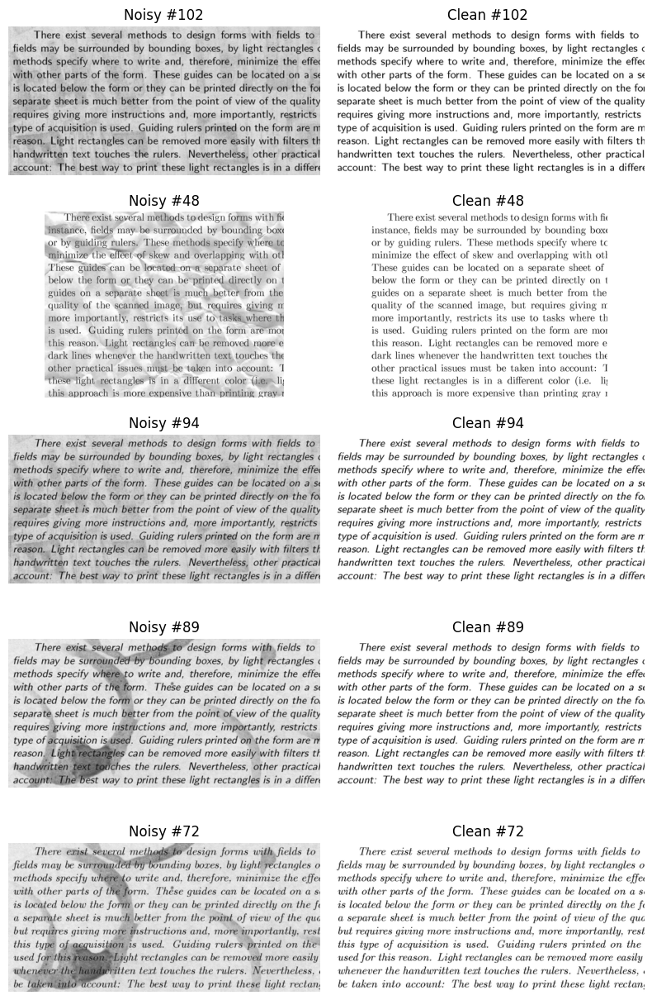

In [5]:
# 5개의 랜덤 이미지를 시각화하는 함수
def visualize_random_images(image_paths, cleaned_paths):
	num_samples = 5
	indices = random.sample(range(len(image_paths)), num_samples)
	
	fig, axes = plt.subplots(num_samples, 2, figsize=(8, 2.5 * num_samples))

	for i, idx in enumerate(indices):
		# 이미지 로딩
		noisy = Image.open(image_paths[idx]).convert('RGB')
		clean = Image.open(cleaned_paths[idx]).convert('RGB')

		# 배열 변환
		noisy_np = np.array(noisy)
		clean_np = np.array(clean)
		
		# 시각화
		axes[i, 0].imshow(noisy_np)
		axes[i, 0].set_title(f"Noisy #{idx}")
		axes[i, 1].imshow(clean_np)
		axes[i, 1].set_title(f"Clean #{idx}")
		
		for j in range(2):
			axes[i, j].axis('off')
		
	plt.tight_layout()
	plt.show()
    
visualize_random_images(
    sorted(glob.glob(os.path.join(train_dir, '*.png'))),
    sorted(glob.glob(os.path.join(train_cleaned_dir, '*.png')))
)



복원 대상 문서는 `.png` 형식의 이미지로 제공되며, 

학습용 데이터는 손상된 문서(`train`)와 해당 정답 이미지(`train_cleaned`)로 구성되어 있습니다. 

테스트용 데이터(`test`)는 손상된 문서만 제공됩니다.

<br />

임의로 선택된 5쌍의 문서 이미지를 시각화하였습니다.

이를 통해 다음과 같은 사실을 확인할 수 있었습니다:
- 학습 데이터로 제공된 손상된 문서와 정답 이미지가 부족하여, 모델이 손상된 문서를 복원하는 데 어려움이 있을 것으로 예상됨
	- 데이터 증강 기법을 활용하여 학습 데이터를 늘릴 필요가 있음
- 손상된 이미지는 얼룩, 텍스트 겹침, 블러 등의 다양한 노이즈를 포함하고 있음
- 이미지 크기는 width는 258, 420 두 가지로 확인되었으며, height는 모두 540px로 동일
	- 패딩을 통해 크기를 통일할 필요가 있음




### 전처리


#### 커스텀 Dataset 클래스를 활용한 데이터셋 구성

손상된 이미지와 정답 이미지가 서로 다른 디렉토리에 저장되어 있어, 파일명을 기준으로 정확하게 매칭하기 위해 커스텀 Dataset 클래스를 정의하였습니다.
 
또한, 학습에 필요한 전처리를 통일되게 적용하고, 재사용성을 높이기 위해 아래와 같은 클래스를 구성하였습니다.

In [6]:
# 데이터 로드
class DocumentDataset(Dataset):
    def __init__(self, image_dir, cleaned_dir=None, transform=None, cleaned_transform=None):
        self.cleaned_dir = cleaned_dir
        self.transform = transform
        self.cleaned_transform = cleaned_transform
        self.images = sorted(glob.glob(os.path.join(image_dir, "*.png")))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert("L")

        if self.cleaned_dir:
            cleaned_path = os.path.join(self.cleaned_dir, os.path.basename(image_path))
            cleaned = Image.open(cleaned_path).convert("L")
        else:
            cleaned = None

        if self.transform:
            image = self.transform(image)
            if cleaned is not None:
				# 텐서가 아니면 텐서로 변환
                if not isinstance(cleaned, torch.Tensor):
                    cleaned = self.cleaned_transform(cleaned)

        return (image, cleaned) if cleaned is not None else image

# 이미지 크기 통일
class PadToSize:
    def __init__(self, target_size):
        self.target_size = target_size

    def __call__(self, image):
        _, height, _ = image.shape
        
        # height가 420, 258 둘 중 하나이기 때문에 위 아래에 81씩 패딩을 추가
        padding = 81 if height < self.target_size[1] else 0
        return TF.pad(image, (0, padding, 0, padding), fill=255)



#### 입력 크기 통일

학습 데이터 해상도가 (540, 258)와 (540, 420) 두 가지로 확인되었습니다.

따라서, 모델의 입력 크기를 통일하기 위해 패딩을 적용하여 모든 이미지를 (540, 420) 크기로 조정하였습니다.

In [7]:
compose_list = [
	v2.ToImage(),
	PadToSize((540, 420)),  # 이미지 크기 통일
	v2.ToDtype(dtype=torch.float32, scale=True),
]
# 데이터셋 인스턴스 생성
train_dataset = DocumentDataset(
    train_dir, 
    train_cleaned_dir, 
    transform=v2.Compose(compose_list),
	cleaned_transform=v2.Compose(compose_list)
)

# 데이터로더 설정
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, drop_last=True)

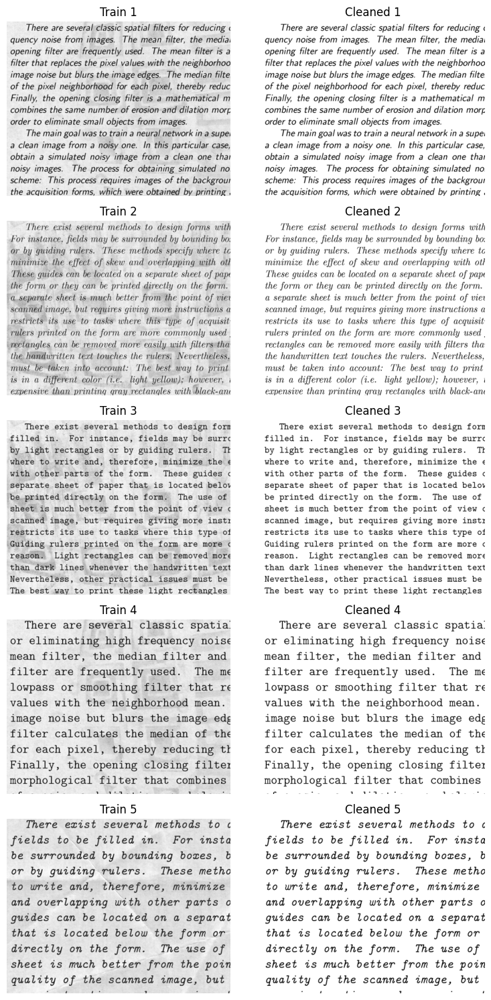

In [8]:
# 패딩이 잘 적용되었는지 확인하기 위한 시각화
num_images=5
# data_loader에서 데이터 하나 가져오기
for train_images, cleaned_images in train_loader:
	# 시각화
	fig, axes = plt.subplots(num_images, 2, figsize=(8, num_images * 3))
	for i in range(num_images):
		# train
		axes[i, 0].imshow(train_images[i].permute(1, 2, 0).squeeze(), cmap='gray')  # [C, H, W] -> [H, W, C]
		axes[i, 0].set_title(f"Train {i+1}")
		axes[i, 0].axis('off')

		# cleaned
		axes[i, 1].imshow(cleaned_images[i].permute(1, 2, 0).squeeze(), cmap='gray')  # [C, H, W] -> [H, W, C]
		axes[i, 1].set_title(f"Cleaned {i+1}")
		axes[i, 1].axis('off')

	plt.tight_layout()
	plt.show()
	break  # 한 번만 실행하도록


In [9]:
# GPU 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == 'cpu':
    # macOS에서 MPS 사용 가능 여부 확인
    device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)

mps


#### 데이터 부족 대비 증강

학습 데이터는 144쌍으로 확인되었는데, 딥러닝 모델을 학습하기에는 부족한 양이라 판단하였으며,

실제 손상 상황(기울어짐, 얼룩, 블러, 노이즈 등)을 모델에 학습시키기 위해 다양한 증강 기법을 적용하였습니다.

In [10]:
def get_datasets(dir_path_dict, is_rotation=False, is_affine=False, is_blur=False, is_noise=False, is_normalize=False):
	compose_list = [
		v2.ToImage(),
		PadToSize((540, 420)),  # 이미지 크기 통일
		v2.ToDtype(dtype=torch.float32, scale=True),
	]
	cleaned_compose_list = [
		v2.ToImage(),
		PadToSize((540, 420)),  # 이미지 크기 통일
		v2.ToDtype(dtype=torch.float32, scale=True),
	]
	test_compose_list = [
		v2.ToImage(),
		PadToSize((540, 420)),  # 이미지 크기 통일
		v2.ToDtype(dtype=torch.float32, scale=True),
	]
	if is_rotation:
		compose_list.append(v2.RandomRotation(degrees=2))  # 회전
	if is_affine:
		compose_list.append(v2.RandomAffine(degrees=0, translate=(0.02, 0.02), scale=(0.98, 1.02)))
	if is_blur:
		compose_list.append(v2.GaussianBlur(kernel_size=3, sigma=(1.0, 2.0)))
	if is_noise:
		compose_list.append(v2.GaussianNoise(sigma=0.1))
	
	if is_normalize:
		compose_list.append(v2.Normalize(mean=[0.5], std=[0.5]))
		cleaned_compose_list.append(v2.Normalize(mean=[0.5], std=[0.5]))
		test_compose_list.append(v2.Normalize(mean=[0.5], std=[0.5]))

	transform = v2.Compose(compose_list)

	# 데이터셋 인스턴스 생성
	train_dataset = DocumentDataset(
		dir_path_dict['train_dir'], 
		dir_path_dict['train_cleaned_dir'], 
		transform=transform, 
		cleaned_transform=v2.Compose(cleaned_compose_list)
	)
	test_dataset = DocumentDataset(
		dir_path_dict['test_dir'], 
		transform=v2.Compose(test_compose_list)
	)

	return train_dataset, test_dataset

def get_loader(train_dataset, test_dataset):
	# 데이터로더 설정
	train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, drop_last=True)
	test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

	return train_loader, test_loader

In [ ]:
train_dataset_1, _ = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=True, is_affine=False, is_blur=False, is_noise=False, is_normalize=True)

train_dataset_2, _ = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=False, is_affine=True, is_blur=False, is_noise=False, is_normalize=True)

train_dataset_3, _ = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=False, is_affine=False, is_blur=True, is_noise=False, is_normalize=True)

train_dataset_4, _ = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=False, is_affine=False, is_blur=False, is_noise=True, is_normalize=True)

train_dataset_5, _ = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=False, is_affine=False, is_blur=True, is_noise=True, is_normalize=True)

train_dataset, test_dataset = get_datasets({
	'train_dir': train_dir,
	'train_cleaned_dir': train_cleaned_dir,
	'test_dir': test_dir
}, is_rotation=False, is_affine=False, is_blur=False, is_noise=False, is_normalize=True)

# 기존 144개의 데이터셋
short_train_loader, _ = get_loader(train_dataset, test_dataset)

# 864개의 데이터셋
train_dataset = ConcatDataset([
    train_dataset,
    train_dataset_1, 
    train_dataset_2,
    train_dataset_3,
    train_dataset_4,
    train_dataset_5,
])

train_loader, test_loader = get_loader(train_dataset, test_dataset)

print('train_dataset size :', len(train_dataset))
print('origin train_dataset size :', len(short_train_loader))

train_dataset size : 864


### 신경망 모델링

In [12]:
# 다양한 인코더, 디코더 모델링을 위한 구조로 설계
class Autoencoder(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        encoded = self.encoder(x)
        
		# 디코딩 과정에서 크기를 420x540으로 맞추기 위해 업샘플링
        # -> (1, 420, 540)
        out = F.interpolate(self.decoder(encoded), size=(420, 540), mode='bilinear', align_corners=False)
        return out

    
def train_autoencoder(model, train_loader, optimizer, loss_fn, epochs=100):
	# 모델 학습
	for epoch in range(epochs):
		model.train()
		total_loss = 0
		total_rmse, total_psnr, n = 0.0, 0.0, 0
		for train_images, cleaned_images in train_loader:  # train_loader에서 가져오기
			# 데이터를 GPU로 전송
			train_images = train_images.to(device)
			cleaned_images = cleaned_images.to(device)

			# 모델 예측 및 손실 계산
			outputs = model(train_images)
			loss = loss_fn(outputs, cleaned_images)
                  
			# RMSE 및 PSNR 계산
			total_rmse  += compute_rmse(outputs, cleaned_images)
			total_psnr  += compute_psnr(outputs, cleaned_images)
			n += 1
                  
			# 역전파 및 최적화
			optimizer.zero_grad()
			loss.backward()
			optimizer.step()
			# 손실 누적
			total_loss += loss.item()
                  
		# 에폭당 평균 손실 출력
		print(f"Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(train_loader):.4f}", end=' ')
		print(f"RMSE: {total_rmse/n:.4f}, PSNR: {total_psnr/n:.2f} dB")

def predict_autoencoder(model, test_loader):
	# 테스트
	model.eval()
	with torch.no_grad():
		for images in test_loader:
			images = images.to(device) # 원본 이미지
			outputs = model(images) # 출력
			return images, outputs

# 시각화 함수
# images: 원본 이미지 텐서
# outputs: 증강 데이터 학습모델 출력 텐서
# diff_outputs: 원본 데이터 학습모델 출력 텐서
def visualize_outputs(images, outputs, diff_outputs, num_images=5):
    fig, axes = plt.subplots(num_images, 3, figsize=(12, num_images * 3))  # num_images 행, 3열

    for i in range(num_images):
        # 첫 번째 열: 원본 이미지
        axes[i, 0].imshow(images[i].cpu().numpy().squeeze(), cmap='gray')
        axes[i, 0].set_title(f"Original {i + 1}", fontsize=10)
        axes[i, 0].axis('off')

        # 두 번째 열: 출력 이미지
        axes[i, 1].imshow(outputs[i].cpu().detach().numpy().squeeze(), cmap='gray')
        axes[i, 1].set_title(f"Long Output {i + 1}", fontsize=10)
        axes[i, 1].axis('off')

        # 세 번째 열: 차이 이미지
        axes[i, 2].imshow(diff_outputs[i].cpu().detach().numpy().squeeze(), cmap='gray')
        axes[i, 2].set_title(f"Short Output {i + 1}", fontsize=10)
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

def compute_rmse(output, target):
    mse = F.mse_loss(output, target, reduction='mean').item()
    return math.sqrt(mse)

def compute_psnr(output, target, max_val=1.0):
    mse = F.mse_loss(output, target, reduction='mean').item()
    return 20 * math.log10(max_val / (math.sqrt(mse) + 1e-8))


입력 이미지의 크기가 (540, 420)로 고정되어 있으므로, 입력층의 크기도 이에 맞추어 설정하였습니다.

인코더와 디코더는 각각 3개의 컨볼루션 레이어로 구성하였으며, 활성화 함수로 ReLU를 사용하였습니다.

In [13]:
# Input: (1, 420, 540)
encoder = nn.Sequential(
	nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=2),  # → (64,420,540)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (64,210,270)
	
	nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), # → (128,210,270)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (128,105,135)

	nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # → (256,105,135)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (256, 52, 67)
)

decoder = nn.Sequential(
	nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),   # → (128,104,134)
	nn.ReLU(),

	nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),   # → (64,208,268)
	nn.ReLU(),

	nn.ConvTranspose2d(64, 1, kernel_size=2, stride=2),    # → (1,416,536)
	nn.Sigmoid(),                                          # → (1,416,536)
)

# 모델 인스턴스 생성
model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─MaxPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-5                         [1, 128, 211, 271]        --
│    └─MaxPool2d: 2-6                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-8                         [1, 256, 105, 135]        --
│    └─MaxPool2d: 2-9                    [1, 256, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 416, 536]          --
│    └─ConvTranspose2d: 2-10             [1, 128, 104, 134]        131,200


In [14]:
lr = 0.0001

#### 모델 학습 및 시각화

In [15]:
# 모델 학습
train_autoencoder(
	model, 
	train_loader, 
	optimizer=optim.Adam(model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/10], Loss: 0.3218 RMSE: 0.5650, PSNR: 5.00 dB
Epoch [2/10], Loss: 0.2524 RMSE: 0.5021, PSNR: 5.99 dB
Epoch [3/10], Loss: 0.2323 RMSE: 0.4816, PSNR: 6.35 dB
Epoch [4/10], Loss: 0.2146 RMSE: 0.4630, PSNR: 6.69 dB
Epoch [5/10], Loss: 0.2085 RMSE: 0.4563, PSNR: 6.82 dB
Epoch [6/10], Loss: 0.2050 RMSE: 0.4525, PSNR: 6.89 dB
Epoch [7/10], Loss: 0.2026 RMSE: 0.4499, PSNR: 6.94 dB
Epoch [8/10], Loss: 0.2002 RMSE: 0.4470, PSNR: 7.00 dB
Epoch [9/10], Loss: 0.1977 RMSE: 0.4442, PSNR: 7.05 dB
Epoch [10/10], Loss: 0.1968 RMSE: 0.4432, PSNR: 7.08 dB


Epoch [1/10], Loss: 0.1752 RMSE: 0.4185, PSNR: 7.57 dB
Epoch [2/10], Loss: 0.1741 RMSE: 0.4169, PSNR: 7.61 dB
Epoch [3/10], Loss: 0.1735 RMSE: 0.4163, PSNR: 7.62 dB
Epoch [4/10], Loss: 0.1729 RMSE: 0.4155, PSNR: 7.64 dB
Epoch [5/10], Loss: 0.1725 RMSE: 0.4152, PSNR: 7.64 dB
Epoch [6/10], Loss: 0.1720 RMSE: 0.4146, PSNR: 7.65 dB
Epoch [7/10], Loss: 0.1716 RMSE: 0.4142, PSNR: 7.66 dB
Epoch [8/10], Loss: 0.1713 RMSE: 0.4137, PSNR: 7.67 dB
Epoch [9/10], Loss: 0.1708 RMSE: 0.4130, PSNR: 7.69 dB
Epoch [10/10], Loss: 0.1705 RMSE: 0.4127, PSNR: 7.69 dB


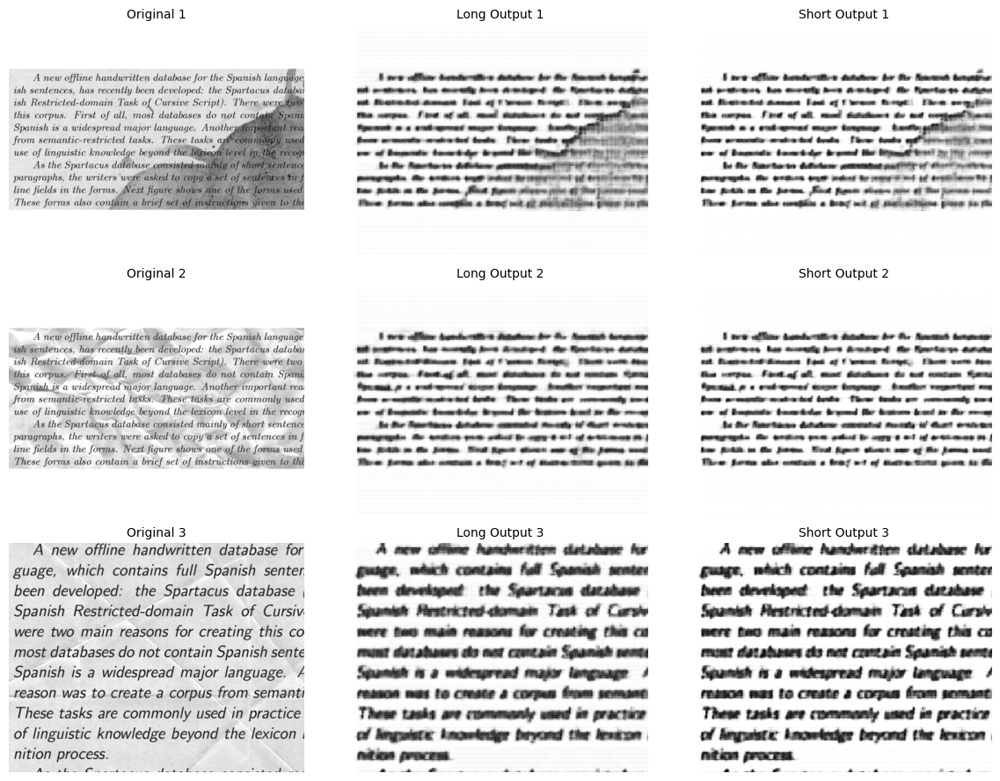

In [16]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=3)

#### 1차 실험 결과

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─MaxPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-5                         [1, 128, 211, 271]        --
│    └─MaxPool2d: 2-6                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-8                         [1, 256, 105, 135]        --
│    └─MaxPool2d: 2-9                    [1, 256, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 416, 536]          --
│    └─ConvTranspose2d: 2-10             [1, 128, 104, 134]        131,200
│    └─ReLU: 2-11                        [1, 128, 104, 134]        --
│    └─ConvTranspose2d: 2-12             [1, 64, 208, 268]         32,832
│    └─ReLU: 2-13                        [1, 64, 208, 268]         --
│    └─ConvTranspose2d: 2-14             [1, 1, 416, 536]          257
│    └─Sigmoid: 2-15                     [1, 1, 416, 536]          --
==========================================================================================
```
Estimated Total Size (MB): 252.33

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(38s vs 6m40s) 수렴했고, 훈련 손실도 낮음
- 증강 데이터 모델은 훨씬 느리게 학습되며, 손실이 더 높게 머무름
- 시각화 결과도 증강 모델 쪽이 텍스트가 더 흐릿하고 격자 무늬 노이즈가 보임

데이터 증강은 모델의 일반화 능력을 향상시키는 데 도움이 될 수 있지만,
이번 실험에서는 오히려 손실이 증가하고 시각화 결과가 좋지 않았습니다.

학습 데이터의 특성을 고려할 때, 증강된 데이터를 10에폭만으로 학습하기에는 충분하지 않았던 것으로 판단됩니다.


In [17]:
# 채널 수를 늘림
encoder = nn.Sequential(
	nn.Conv2d(1, 128, kernel_size=3, stride=1, padding=2),  # → (128,420,540)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (128,210,270)

	nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # → (256,210,270)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (256,105,135)

	nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1), # → (512,105,135)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (512, 52, 67)
)
decoder = nn.Sequential(
	nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),   # → (256,104,134)
	nn.ReLU(),

	nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),   # → (128,208,268)
	nn.ReLU(),

	nn.ConvTranspose2d(128, 1, kernel_size=2, stride=2),    # → (1,416,536)
	nn.Sigmoid(),                                          # → (1,416,536)
)

model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 512, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 128, 422, 542]        1,280
│    └─ReLU: 2-2                         [1, 128, 422, 542]        --
│    └─MaxPool2d: 2-3                    [1, 128, 211, 271]        --
│    └─Conv2d: 2-4                       [1, 256, 211, 271]        295,168
│    └─ReLU: 2-5                         [1, 256, 211, 271]        --
│    └─MaxPool2d: 2-6                    [1, 256, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 512, 105, 135]        1,180,160
│    └─ReLU: 2-8                         [1, 512, 105, 135]        --
│    └─MaxPool2d: 2-9                    [1, 512, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 416, 536]          --
│    └─ConvTranspose2d: 2-10             [1, 256, 104, 134]        524

In [18]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=10,
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/10], Loss: 0.2520 RMSE: 0.5012, PSNR: 6.01 dB
Epoch [2/10], Loss: 0.2106 RMSE: 0.4586, PSNR: 6.78 dB
Epoch [3/10], Loss: 0.2033 RMSE: 0.4505, PSNR: 6.93 dB
Epoch [4/10], Loss: 0.1993 RMSE: 0.4462, PSNR: 7.02 dB
Epoch [5/10], Loss: 0.1962 RMSE: 0.4425, PSNR: 7.09 dB
Epoch [6/10], Loss: 0.1954 RMSE: 0.4418, PSNR: 7.10 dB
Epoch [7/10], Loss: 0.1943 RMSE: 0.4404, PSNR: 7.13 dB
Epoch [8/10], Loss: 0.1936 RMSE: 0.4397, PSNR: 7.14 dB
Epoch [9/10], Loss: 0.1930 RMSE: 0.4390, PSNR: 7.16 dB
Epoch [10/10], Loss: 0.1912 RMSE: 0.4370, PSNR: 7.20 dB


Epoch [1/10], Loss: 0.1722 RMSE: 0.4144, PSNR: 7.66 dB
Epoch [2/10], Loss: 0.1685 RMSE: 0.4103, PSNR: 7.74 dB
Epoch [3/10], Loss: 0.1663 RMSE: 0.4076, PSNR: 7.80 dB
Epoch [4/10], Loss: 0.1656 RMSE: 0.4067, PSNR: 7.82 dB
Epoch [5/10], Loss: 0.1651 RMSE: 0.4060, PSNR: 7.84 dB
Epoch [6/10], Loss: 0.1646 RMSE: 0.4053, PSNR: 7.85 dB
Epoch [7/10], Loss: 0.1641 RMSE: 0.4049, PSNR: 7.86 dB
Epoch [8/10], Loss: 0.1637 RMSE: 0.4043, PSNR: 7.87 dB
Epoch [9/10], Loss: 0.1634 RMSE: 0.4041, PSNR: 7.87 dB
Epoch [10/10], Loss: 0.1630 RMSE: 0.4037, PSNR: 7.88 dB


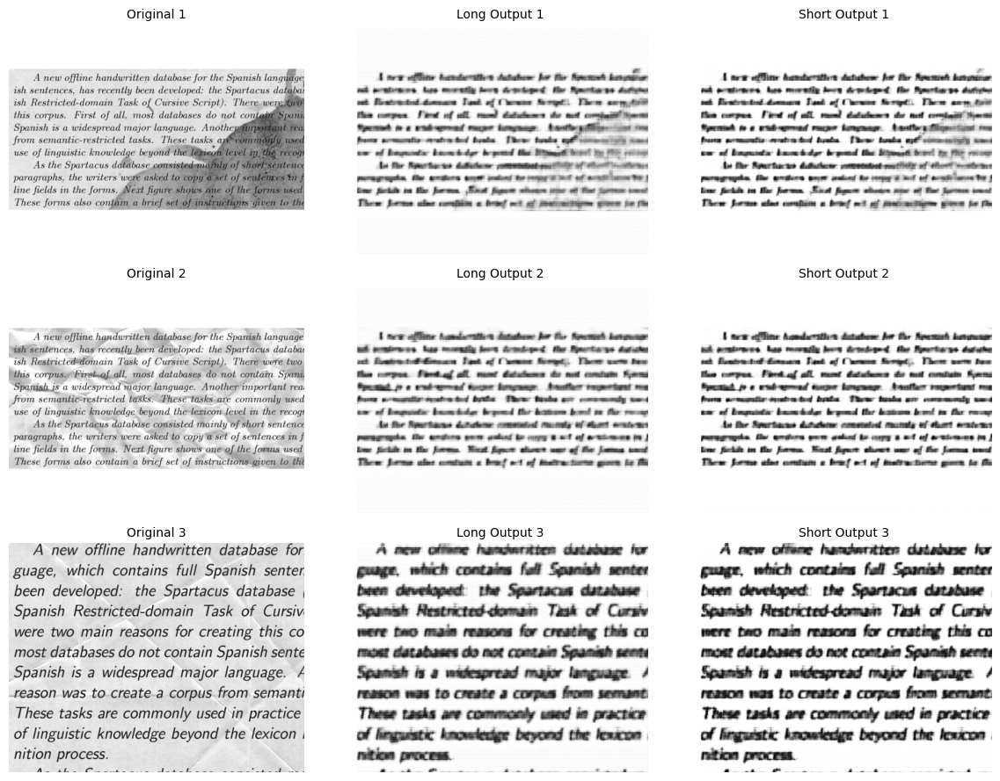

In [19]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=3)

#### 2차 실험 결과

1차 실험 모델에서 Conv2d 레이어와 ConvTranspose2d 레이어의 채널 수를 늘려 모델의 용량을 증가시켰습니다.

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 512, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 128, 422, 542]        1,280
│    └─ReLU: 2-2                         [1, 128, 422, 542]        --
│    └─MaxPool2d: 2-3                    [1, 128, 211, 271]        --
│    └─Conv2d: 2-4                       [1, 256, 211, 271]        295,168
│    └─ReLU: 2-5                         [1, 256, 211, 271]        --
│    └─MaxPool2d: 2-6                    [1, 256, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 512, 105, 135]        1,180,160
│    └─ReLU: 2-8                         [1, 512, 105, 135]        --
│    └─MaxPool2d: 2-9                    [1, 512, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 416, 536]          --
│    └─ConvTranspose2d: 2-10             [1, 256, 104, 134]        524,544
│    └─ReLU: 2-11                        [1, 256, 104, 134]        --
│    └─ConvTranspose2d: 2-12             [1, 128, 208, 268]        131,200
│    └─ReLU: 2-13                        [1, 128, 208, 268]        --
│    └─ConvTranspose2d: 2-14             [1, 1, 416, 536]          513
│    └─Sigmoid: 2-15                     [1, 1, 416, 536]          --
==========================================================================================
```
Estimated Total Size (MB): 506.23

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(2m6s vs 13m12s) 수렴했고, 훈련 손실도 낮음
- 증강 데이터 모델은 훨씬 느리게 학습되며, 손실이 더 높게 머무름
- 시각화 결과도 1차 실험과 별 차이가 없어보임

채널 수를 늘려 모델의 용량을 증가시켰지만, 여전히 증강 데이터 모델의 성능이 기본 데이터 모델에 비해 좋지 않고
모델 학습 속도가 매우 느렸습니다.


In [20]:
# 레이어 수를 늘림
encoder = nn.Sequential(
	nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=2),  # → (64,420,540)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (64,210,270)

	nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=2),  # → (128,420,540)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (128,105,135)

	nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # → (256,105,135)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (256,52,67)

	nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1), # → (512,52,67)
	nn.ReLU(),
	nn.MaxPool2d(2, 2),                                    # → (512, 26, 33)
)

decoder = nn.Sequential(
	nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),   # → (256,52,67)
	nn.ReLU(),

	nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),   # → (128,104,134)
	nn.ReLU(),

	nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),   # → (64,208,268)
	nn.ReLU(),

	nn.ConvTranspose2d(64, 1, kernel_size=2, stride=2),    # → (1,416,536)
	nn.Sigmoid(),                                          
)

# 모델 인스턴스 생성
model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 512, 26, 34]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─MaxPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 213, 273]        73,856
│    └─ReLU: 2-5                         [1, 128, 213, 273]        --
│    └─MaxPool2d: 2-6                    [1, 128, 106, 136]        --
│    └─Conv2d: 2-7                       [1, 256, 106, 136]        295,168
│    └─ReLU: 2-8                         [1, 256, 106, 136]        --
│    └─MaxPool2d: 2-9                    [1, 256, 53, 68]          --
│    └─Conv2d: 2-10                      [1, 512, 53, 68]          1,180,160
│    └─ReLU: 2-11                        [1, 512, 53, 68]          -

In [21]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=10, 
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/10], Loss: 0.3367 RMSE: 0.5767, PSNR: 4.83 dB
Epoch [2/10], Loss: 0.2562 RMSE: 0.5060, PSNR: 5.92 dB
Epoch [3/10], Loss: 0.2509 RMSE: 0.5006, PSNR: 6.02 dB
Epoch [4/10], Loss: 0.2387 RMSE: 0.4882, PSNR: 6.23 dB
Epoch [5/10], Loss: 0.2186 RMSE: 0.4674, PSNR: 6.61 dB
Epoch [6/10], Loss: 0.2111 RMSE: 0.4592, PSNR: 6.77 dB
Epoch [7/10], Loss: 0.2066 RMSE: 0.4542, PSNR: 6.86 dB
Epoch [8/10], Loss: 0.2054 RMSE: 0.4529, PSNR: 6.89 dB
Epoch [9/10], Loss: 0.2034 RMSE: 0.4505, PSNR: 6.93 dB
Epoch [10/10], Loss: 0.2015 RMSE: 0.4486, PSNR: 6.97 dB


Epoch [1/10], Loss: 0.1853 RMSE: 0.4302, PSNR: 7.33 dB
Epoch [2/10], Loss: 0.1842 RMSE: 0.4289, PSNR: 7.36 dB
Epoch [3/10], Loss: 0.1836 RMSE: 0.4284, PSNR: 7.36 dB
Epoch [4/10], Loss: 0.1830 RMSE: 0.4277, PSNR: 7.38 dB
Epoch [5/10], Loss: 0.1825 RMSE: 0.4271, PSNR: 7.39 dB
Epoch [6/10], Loss: 0.1821 RMSE: 0.4263, PSNR: 7.41 dB
Epoch [7/10], Loss: 0.1817 RMSE: 0.4260, PSNR: 7.42 dB
Epoch [8/10], Loss: 0.1813 RMSE: 0.4258, PSNR: 7.42 dB
Epoch [9/10], Loss: 0.1809 RMSE: 0.4252, PSNR: 7.43 dB
Epoch [10/10], Loss: 0.1805 RMSE: 0.4247, PSNR: 7.44 dB


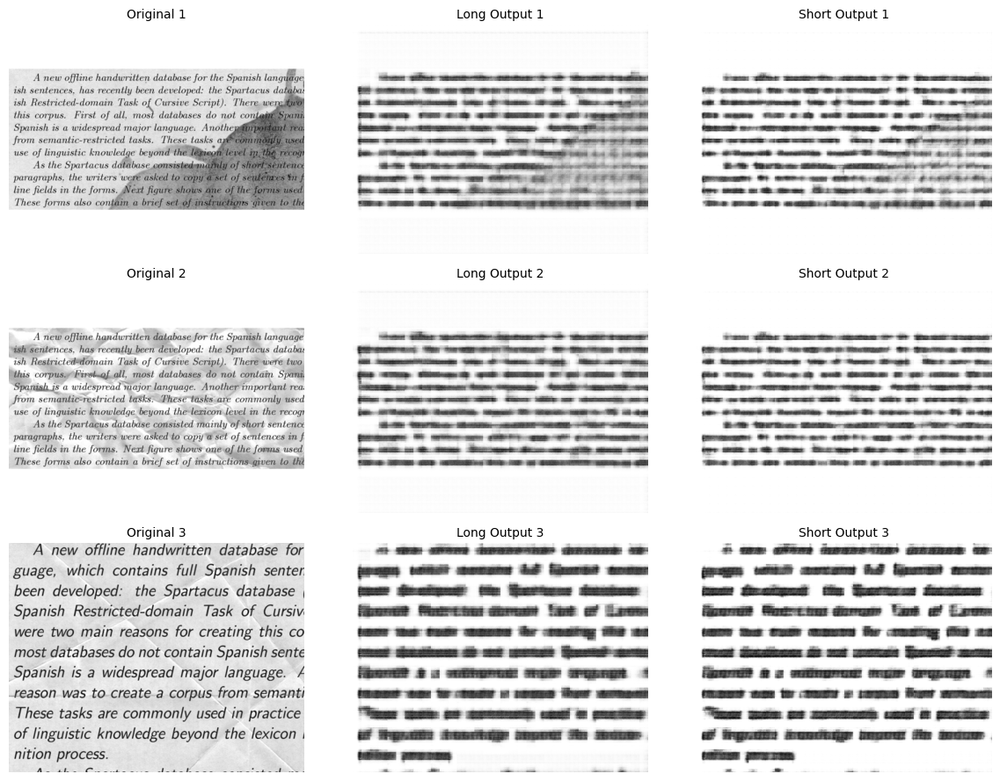

In [22]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=3)

#### 3차 실험 결과

1차 실험 모델에서 Conv2d 레이어와 ConvTranspose2d 레이어를 더 늘려 성능을 개선하고자 하였습니다.

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 512, 26, 34]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─MaxPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 213, 273]        73,856
│    └─ReLU: 2-5                         [1, 128, 213, 273]        --
│    └─MaxPool2d: 2-6                    [1, 128, 106, 136]        --
│    └─Conv2d: 2-7                       [1, 256, 106, 136]        295,168
│    └─ReLU: 2-8                         [1, 256, 106, 136]        --
│    └─MaxPool2d: 2-9                    [1, 256, 53, 68]          --
│    └─Conv2d: 2-10                      [1, 512, 53, 68]          1,180,160
│    └─ReLU: 2-11                        [1, 512, 53, 68]          --
│    └─MaxPool2d: 2-12                   [1, 512, 26, 34]          --
├─Sequential: 1-2                        [1, 1, 416, 544]          --
│    └─ConvTranspose2d: 2-13             [1, 256, 52, 68]          524,544
│    └─ReLU: 2-14                        [1, 256, 52, 68]          --
│    └─ConvTranspose2d: 2-15             [1, 128, 104, 136]        131,200
│    └─ReLU: 2-16                        [1, 128, 104, 136]        --
│    └─ConvTranspose2d: 2-17             [1, 64, 208, 272]         32,832
│    └─ReLU: 2-18                        [1, 64, 208, 272]         --
│    └─ConvTranspose2d: 2-19             [1, 1, 416, 544]          257
│    └─Sigmoid: 2-20                     [1, 1, 416, 544]          --
==========================================================================================
```
Estimated Total Size (MB): 283.30

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(47s vs 5m12s) 수렴했고, 훈련 손실도 낮음
- 시각화 결과도 1차, 2차 실험 보다 복원된 이미지가 흐려짐

1차실험에 비해 레이어 수를 늘려 모델의 용량을 증가시켰지만, 오히려 성능이 저하되었습니다.


In [23]:
# maxpool을 avgpool로 변경 -> 기대효과: 얼룩부분에서 더 부드러운 특징 추출
encoder = nn.Sequential(
	nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=2),  
	nn.ReLU(),
	nn.AvgPool2d(2, 2),

	nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), 
	nn.ReLU(),
	nn.AvgPool2d(2, 2),
														
	nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), 
	nn.ReLU(),
	nn.AvgPool2d(2, 2),                                                   
)

decoder = nn.Sequential(
	nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2),   
	nn.ReLU(),

	nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),    
	nn.ReLU(),

	nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2),    
	nn.Sigmoid(),                                          
)

# 모델 인스턴스 생성
model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─AvgPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-5                         [1, 128, 211, 271]        --
│    └─AvgPool2d: 2-6                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-8                         [1, 256, 105, 135]        --
│    └─AvgPool2d: 2-9                    [1, 256, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 421, 541]          --
│    └─ConvTranspose2d: 2-10             [1, 128, 105, 135]        295,040


In [24]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=10, 
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/10], Loss: 0.2900 RMSE: 0.5376, PSNR: 5.40 dB
Epoch [2/10], Loss: 0.2368 RMSE: 0.4864, PSNR: 6.26 dB
Epoch [3/10], Loss: 0.2135 RMSE: 0.4618, PSNR: 6.72 dB
Epoch [4/10], Loss: 0.2048 RMSE: 0.4523, PSNR: 6.90 dB
Epoch [5/10], Loss: 0.1990 RMSE: 0.4456, PSNR: 7.03 dB
Epoch [6/10], Loss: 0.1952 RMSE: 0.4413, PSNR: 7.12 dB
Epoch [7/10], Loss: 0.1939 RMSE: 0.4399, PSNR: 7.14 dB
Epoch [8/10], Loss: 0.1929 RMSE: 0.4388, PSNR: 7.16 dB
Epoch [9/10], Loss: 0.1914 RMSE: 0.4370, PSNR: 7.20 dB
Epoch [10/10], Loss: 0.1908 RMSE: 0.4363, PSNR: 7.21 dB


Epoch [1/10], Loss: 0.1640 RMSE: 0.4048, PSNR: 7.86 dB
Epoch [2/10], Loss: 0.1629 RMSE: 0.4035, PSNR: 7.88 dB
Epoch [3/10], Loss: 0.1622 RMSE: 0.4026, PSNR: 7.91 dB
Epoch [4/10], Loss: 0.1617 RMSE: 0.4019, PSNR: 7.92 dB
Epoch [5/10], Loss: 0.1611 RMSE: 0.4013, PSNR: 7.93 dB
Epoch [6/10], Loss: 0.1606 RMSE: 0.4006, PSNR: 7.95 dB
Epoch [7/10], Loss: 0.1601 RMSE: 0.4000, PSNR: 7.96 dB
Epoch [8/10], Loss: 0.1596 RMSE: 0.3993, PSNR: 7.98 dB
Epoch [9/10], Loss: 0.1591 RMSE: 0.3987, PSNR: 7.99 dB
Epoch [10/10], Loss: 0.1587 RMSE: 0.3979, PSNR: 8.01 dB


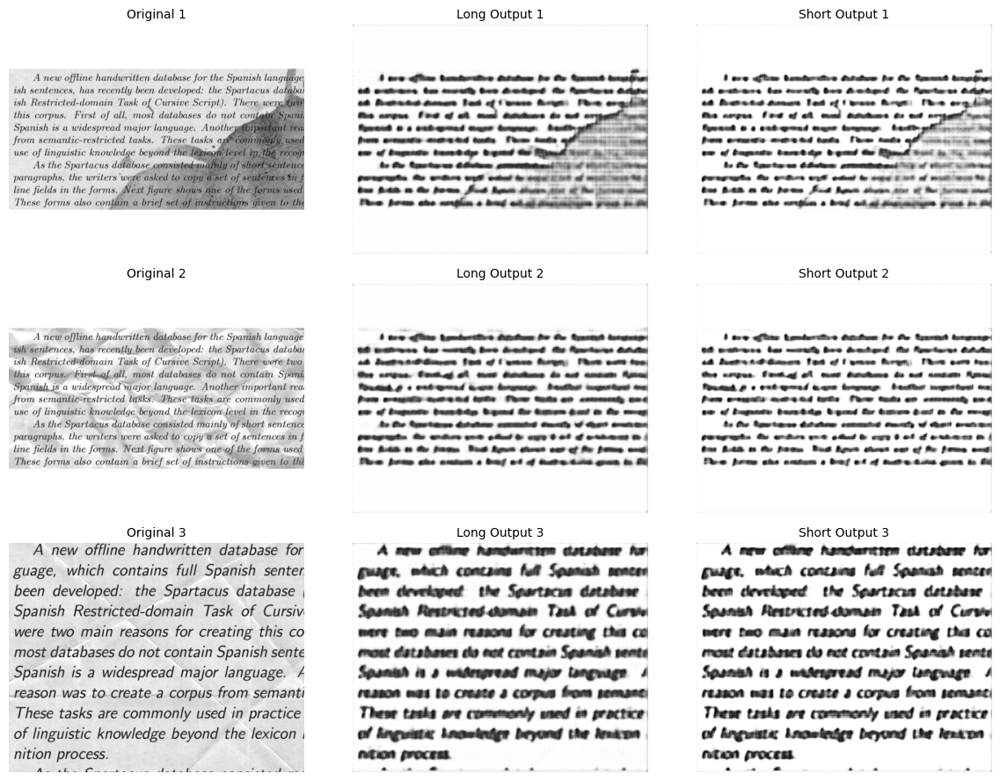

In [25]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=3)

#### 4차 실험 결과

1차 실험 모델에서 풀링 레이어를 AvgPool2d로 변경하여 얼룩부분에서 더 부드러운 특징 추출하고자 하였습니다.

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─AvgPool2d: 2-3                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-4                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-5                         [1, 128, 211, 271]        --
│    └─AvgPool2d: 2-6                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-7                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-8                         [1, 256, 105, 135]        --
│    └─AvgPool2d: 2-9                    [1, 256, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 421, 541]          --
│    └─ConvTranspose2d: 2-10             [1, 128, 105, 135]        295,040
│    └─ReLU: 2-11                        [1, 128, 105, 135]        --
│    └─ConvTranspose2d: 2-12             [1, 64, 210, 270]         32,832
│    └─ReLU: 2-13                        [1, 64, 210, 270]         --
│    └─ConvTranspose2d: 2-14             [1, 1, 421, 541]          577
│    └─Sigmoid: 2-15                     [1, 1, 421, 541]          --
==========================================================================================
```
Estimated Total Size (MB): 253.76

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(45s vs 4m27s) 수렴했고, 훈련 손실도 낮음
- 시각화 결과가 1차 실험 보다 복원된 이미지가 조금 더 선명해짐

에폭을 더 늘려 학습을 진행하면 성능이 개선될 것으로 예상되지만,
텍스트기반의 학습 데이터를 고려할 때 MaxPoll2d 레이어가 더 적합할 것으로 판단되어
AvgPool2d 레이어를 사용한 실험은 종료하였습니다.


In [26]:
# 배치 정규화 추가
encoder = nn.Sequential(
	nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=2),  
	nn.ReLU(),
	nn.BatchNorm2d(64),  # 배치 정규화 추가
	nn.MaxPool2d(2, 2),

	nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), 
	nn.ReLU(),
	nn.BatchNorm2d(128),  # 배치 정규화 추가
	nn.MaxPool2d(2, 2),
														
	nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), 
	nn.ReLU(),
	nn.BatchNorm2d(256),  # 배치 정규화 추가
	nn.MaxPool2d(2, 2),                                                   
)

decoder = nn.Sequential(
	nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2),   
	nn.ReLU(),
	nn.BatchNorm2d(128),  # 배치 정규화 추가

	nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),    
	nn.ReLU(),
	nn.BatchNorm2d(64),  # 배치 정규화 추가

	nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2),    
	nn.Sigmoid(),                                          
)

# 모델 인스턴스 생성
model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─BatchNorm2d: 2-3                  [1, 64, 422, 542]         128
│    └─MaxPool2d: 2-4                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-5                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-6                         [1, 128, 211, 271]        --
│    └─BatchNorm2d: 2-7                  [1, 128, 211, 271]        256
│    └─MaxPool2d: 2-8                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-9                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-10                        [1, 256, 105, 135]        --
│    └─BatchNorm2d: 2-11                 [1, 256, 105, 135]        512
│ 

In [27]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=10, 
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/10], Loss: 0.2681 RMSE: 0.5165, PSNR: 5.76 dB
Epoch [2/10], Loss: 0.2128 RMSE: 0.4609, PSNR: 6.74 dB
Epoch [3/10], Loss: 0.1954 RMSE: 0.4418, PSNR: 7.10 dB
Epoch [4/10], Loss: 0.1857 RMSE: 0.4305, PSNR: 7.33 dB
Epoch [5/10], Loss: 0.1798 RMSE: 0.4237, PSNR: 7.47 dB
Epoch [6/10], Loss: 0.1765 RMSE: 0.4196, PSNR: 7.56 dB
Epoch [7/10], Loss: 0.1714 RMSE: 0.4136, PSNR: 7.67 dB
Epoch [8/10], Loss: 0.1693 RMSE: 0.4108, PSNR: 7.74 dB
Epoch [9/10], Loss: 0.1658 RMSE: 0.4067, PSNR: 7.82 dB
Epoch [10/10], Loss: 0.1647 RMSE: 0.4053, PSNR: 7.86 dB


Epoch [1/10], Loss: 0.1201 RMSE: 0.3464, PSNR: 9.21 dB
Epoch [2/10], Loss: 0.1173 RMSE: 0.3424, PSNR: 9.31 dB
Epoch [3/10], Loss: 0.1158 RMSE: 0.3401, PSNR: 9.37 dB
Epoch [4/10], Loss: 0.1145 RMSE: 0.3383, PSNR: 9.42 dB
Epoch [5/10], Loss: 0.1132 RMSE: 0.3363, PSNR: 9.47 dB
Epoch [6/10], Loss: 0.1119 RMSE: 0.3345, PSNR: 9.51 dB
Epoch [7/10], Loss: 0.1108 RMSE: 0.3327, PSNR: 9.56 dB
Epoch [8/10], Loss: 0.1097 RMSE: 0.3311, PSNR: 9.60 dB
Epoch [9/10], Loss: 0.1086 RMSE: 0.3294, PSNR: 9.65 dB
Epoch [10/10], Loss: 0.1074 RMSE: 0.3276, PSNR: 9.69 dB


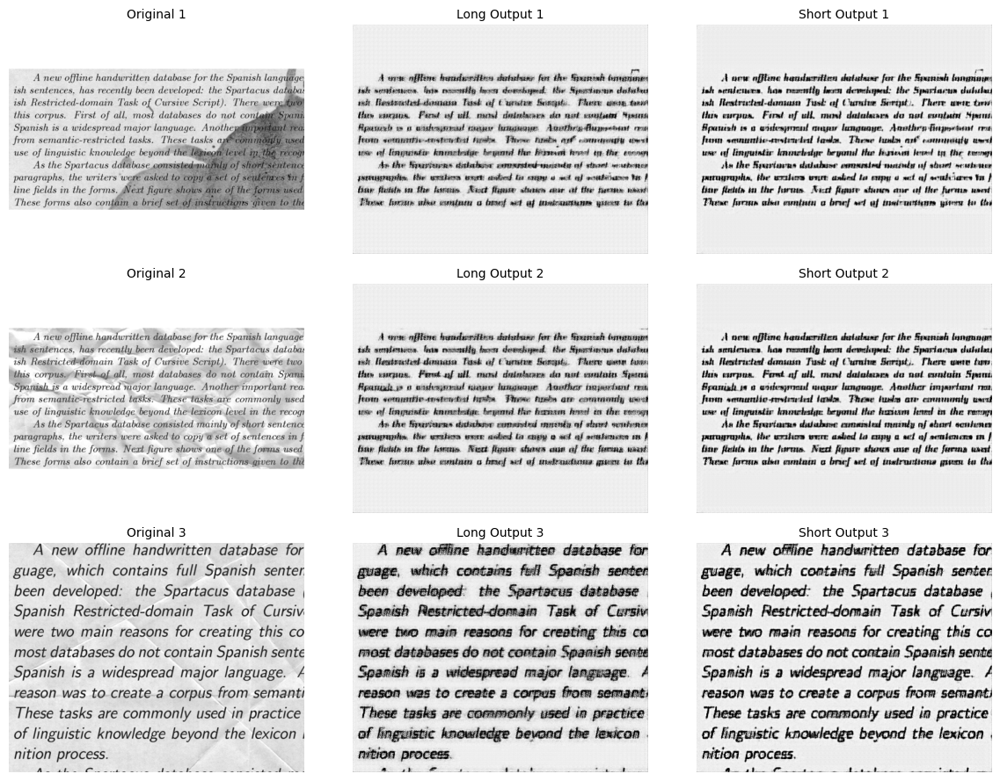

In [28]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=10,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=3)

#### 5차 실험 결과

1차 실험 모델에서 각 레이어 마다 배치정규화(Batch Normalization)를 추가하여 학습 안정성을 높이고자 하였습니다.

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 256, 52, 67]          --
│    └─Conv2d: 2-1                       [1, 64, 422, 542]         640
│    └─ReLU: 2-2                         [1, 64, 422, 542]         --
│    └─BatchNorm2d: 2-3                  [1, 64, 422, 542]         128
│    └─MaxPool2d: 2-4                    [1, 64, 211, 271]         --
│    └─Conv2d: 2-5                       [1, 128, 211, 271]        73,856
│    └─ReLU: 2-6                         [1, 128, 211, 271]        --
│    └─BatchNorm2d: 2-7                  [1, 128, 211, 271]        256
│    └─MaxPool2d: 2-8                    [1, 128, 105, 135]        --
│    └─Conv2d: 2-9                       [1, 256, 105, 135]        295,168
│    └─ReLU: 2-10                        [1, 256, 105, 135]        --
│    └─BatchNorm2d: 2-11                 [1, 256, 105, 135]        512
│    └─MaxPool2d: 2-12                   [1, 256, 52, 67]          --
├─Sequential: 1-2                        [1, 1, 421, 541]          --
│    └─ConvTranspose2d: 2-13             [1, 128, 105, 135]        295,040
│    └─ReLU: 2-14                        [1, 128, 105, 135]        --
│    └─BatchNorm2d: 2-15                 [1, 128, 105, 135]        256
│    └─ConvTranspose2d: 2-16             [1, 64, 210, 270]         32,832
│    └─ReLU: 2-17                        [1, 64, 210, 270]         --
│    └─BatchNorm2d: 2-18                 [1, 64, 210, 270]         128
│    └─ConvTranspose2d: 2-19             [1, 1, 421, 541]          577
│    └─Sigmoid: 2-20                     [1, 1, 421, 541]          --
==========================================================================================
```
Estimated Total Size (MB): 502.00

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(46s vs 5m2s) 수렴했고, 훈련 손실도 낮음
- 시각화 결과가 1차 실험 보다 복원된 이미지가 매우 선명해짐



In [29]:
# 레이어 최적화, 드롭아웃 추가 및 업샘플링 방식 추가로 이미지 품질 개선
encoder = nn.Sequential(
	nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1),   # 입력 채널 1 → 64, 3x3 컨볼루션
	nn.ReLU(),

	nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), # 64 → 128 채널, 3x3 컨볼루션
	nn.ReLU(),
	nn.BatchNorm2d(128),                                    # 배치 정규화로 학습 안정화
	nn.MaxPool2d(kernel_size=2, stride=2),      		    # 다운샘플링 (공간 크기 절반)

	nn.Dropout(0.5, inplace=False),                         # 드롭아웃(50%)로 과적합 방지
)

decoder = nn.Sequential(
	nn.ConvTranspose2d(128, 128, kernel_size=3, stride=1, padding=1), # 채널 유지, 공간 크기 보존
	nn.ReLU(),

	nn.ConvTranspose2d(128, 64, kernel_size=3, stride=1, padding=1),  # 채널 128 → 64, 공간 크기 보존
	nn.ReLU(),
	nn.BatchNorm2d(64),                                               # 배치 정규화로 학습 안정화
	nn.Upsample(scale_factor=2.0),                                    # 업샘플링 (공간 크기 2배)
    
	nn.ConvTranspose2d(64, 1, kernel_size=3, stride=1, padding=1),    # 채널 64 → 1, 최종 출력
	nn.Sigmoid(),                                                     # 픽셀값 [0,1]로 정규화
)

# 모델 인스턴스 생성
model = Autoencoder(encoder, decoder).to(device)
summary(model, input_size=(1, 1, 420, 540), device=device)

Layer (type:depth-idx)                   Output Shape              Param #
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 128, 210, 270]        --
│    └─Conv2d: 2-1                       [1, 64, 420, 540]         640
│    └─ReLU: 2-2                         [1, 64, 420, 540]         --
│    └─Conv2d: 2-3                       [1, 128, 420, 540]        73,856
│    └─ReLU: 2-4                         [1, 128, 420, 540]        --
│    └─BatchNorm2d: 2-5                  [1, 128, 420, 540]        256
│    └─MaxPool2d: 2-6                    [1, 128, 210, 270]        --
│    └─Dropout: 2-7                      [1, 128, 210, 270]        --
├─Sequential: 1-2                        [1, 1, 420, 540]          --
│    └─ConvTranspose2d: 2-8              [1, 128, 210, 270]        147,584
│    └─ReLU: 2-9                         [1, 128, 210, 270]        --
│    └─ConvTranspose2d: 2-10             [1, 64, 210, 270]         73,792


In [30]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=20, 
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/20], Loss: 0.2478 RMSE: 0.4900, PSNR: 6.31 dB
Epoch [2/20], Loss: 0.1713 RMSE: 0.4122, PSNR: 7.73 dB
Epoch [3/20], Loss: 0.1618 RMSE: 0.4010, PSNR: 7.96 dB
Epoch [4/20], Loss: 0.1540 RMSE: 0.3906, PSNR: 8.20 dB
Epoch [5/20], Loss: 0.1510 RMSE: 0.3872, PSNR: 8.27 dB
Epoch [6/20], Loss: 0.1486 RMSE: 0.3839, PSNR: 8.35 dB
Epoch [7/20], Loss: 0.1438 RMSE: 0.3778, PSNR: 8.49 dB
Epoch [8/20], Loss: 0.1454 RMSE: 0.3800, PSNR: 8.43 dB
Epoch [9/20], Loss: 0.1424 RMSE: 0.3754, PSNR: 8.56 dB
Epoch [10/20], Loss: 0.1432 RMSE: 0.3764, PSNR: 8.53 dB
Epoch [11/20], Loss: 0.1423 RMSE: 0.3756, PSNR: 8.54 dB
Epoch [12/20], Loss: 0.1388 RMSE: 0.3709, PSNR: 8.66 dB
Epoch [13/20], Loss: 0.1380 RMSE: 0.3699, PSNR: 8.68 dB
Epoch [14/20], Loss: 0.1383 RMSE: 0.3696, PSNR: 8.70 dB
Epoch [15/20], Loss: 0.1389 RMSE: 0.3712, PSNR: 8.64 dB
Epoch [16/20], Loss: 0.1381 RMSE: 0.3693, PSNR: 8.71 dB
Epoch [17/20], Loss: 0.1370 RMSE: 0.3683, PSNR: 8.72 dB
Epoch [18/20], Loss: 0.1377 RMSE: 0.3697, PSNR: 8.68 dB
E

Epoch [1/30], Loss: 0.0640 RMSE: 0.2526, PSNR: 11.96 dB
Epoch [2/30], Loss: 0.0612 RMSE: 0.2474, PSNR: 12.14 dB
Epoch [3/30], Loss: 0.0606 RMSE: 0.2461, PSNR: 12.18 dB
Epoch [4/30], Loss: 0.0599 RMSE: 0.2446, PSNR: 12.23 dB
Epoch [5/30], Loss: 0.0596 RMSE: 0.2440, PSNR: 12.26 dB
Epoch [6/30], Loss: 0.0592 RMSE: 0.2431, PSNR: 12.29 dB
Epoch [7/30], Loss: 0.0589 RMSE: 0.2425, PSNR: 12.31 dB
Epoch [8/30], Loss: 0.0587 RMSE: 0.2420, PSNR: 12.33 dB
Epoch [9/30], Loss: 0.0588 RMSE: 0.2422, PSNR: 12.32 dB
Epoch [10/30], Loss: 0.0582 RMSE: 0.2412, PSNR: 12.35 dB
Epoch [11/30], Loss: 0.0581 RMSE: 0.2409, PSNR: 12.37 dB
Epoch [12/30], Loss: 0.0581 RMSE: 0.2408, PSNR: 12.37 dB
Epoch [13/30], Loss: 0.0579 RMSE: 0.2404, PSNR: 12.39 dB
Epoch [14/30], Loss: 0.0578 RMSE: 0.2402, PSNR: 12.39 dB
Epoch [15/30], Loss: 0.0576 RMSE: 0.2400, PSNR: 12.40 dB
Epoch [16/30], Loss: 0.0574 RMSE: 0.2395, PSNR: 12.42 dB
Epoch [17/30], Loss: 0.0573 RMSE: 0.2393, PSNR: 12.42 dB
Epoch [18/30], Loss: 0.0574 RMSE: 0.2394

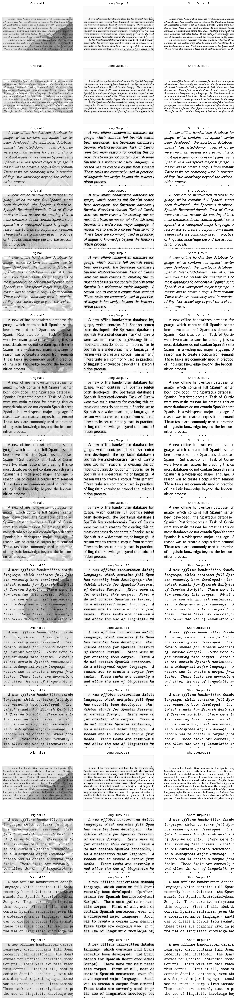

In [31]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=30,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=len(images))

#### 최종 실험 결과

5차 실험 모델에서 각 레이어를 최적화, 인코딩 단계에 드롭아웃을 추가하여 과적합을 방지하고자 하였고,

디코딩 단계에 업샘플링을 추가하여 해상도를 높이고자 하였습니다.

##### 학습 세팅
```text
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
Autoencoder                              [1, 1, 420, 540]          --
├─Sequential: 1-1                        [1, 128, 210, 270]        --
│    └─Conv2d: 2-1                       [1, 64, 420, 540]         640
│    └─ReLU: 2-2                         [1, 64, 420, 540]         --
│    └─Conv2d: 2-3                       [1, 128, 420, 540]        73,856
│    └─ReLU: 2-4                         [1, 128, 420, 540]        --
│    └─BatchNorm2d: 2-5                  [1, 128, 420, 540]        256
│    └─MaxPool2d: 2-6                    [1, 128, 210, 270]        --
│    └─Dropout: 2-7                      [1, 128, 210, 270]        --
├─Sequential: 1-2                        [1, 1, 420, 540]          --
│    └─ConvTranspose2d: 2-8              [1, 128, 210, 270]        147,584
│    └─ReLU: 2-9                         [1, 128, 210, 270]        --
│    └─ConvTranspose2d: 2-10             [1, 64, 210, 270]         73,792
│    └─ReLU: 2-11                        [1, 64, 210, 270]         --
│    └─BatchNorm2d: 2-12                 [1, 64, 210, 270]         128
│    └─Upsample: 2-13                    [1, 64, 420, 540]         --
│    └─ConvTranspose2d: 2-14             [1, 1, 420, 540]          577
│    └─Sigmoid: 2-15                     [1, 1, 420, 540]          --
==========================================================================================
```
Estimated Total Size (MB): 700.64

- 손실함수: MSELoss
- 최적화 도구: Adam
- 학습률: 0.0001
- 에폭: 10

##### 학습 결과

- 기본 데이터 모델이 더 빠르게(1m55s vs 12m2s) 수렴했고, 훈련 손실도 낮음
- 시각화 결과가 5차 실험 보다 복원된 이미지가 매우 선명해짐


## 결론

주어진 학습데이터처럼 단순한 패턴의 이미지 복원은 증강기법이 오히려 성능을 저하시킬 수 있음을 보여줍니다.

무작정 채널을  늘리거나 레이어를 추가하는 것보다는, 모델의 용량을 적절히 조절하고, 적절한 전처리와 증강 기법을 적용하는 것이 중요함을 알 수 있었습니다.


In [32]:
# 모델 학습
train_autoencoder(
    model, 
    train_loader, 
    optimizer=optim.Adam(model.parameters(), lr=lr), 
    loss_fn=nn.MSELoss(), 
    epochs=20, 
)

# 모델 예측 및 시각화
images, outputs = predict_autoencoder(model, test_loader)

Epoch [1/20], Loss: 0.1346 RMSE: 0.3653, PSNR: 8.78 dB
Epoch [2/20], Loss: 0.1332 RMSE: 0.3632, PSNR: 8.84 dB
Epoch [3/20], Loss: 0.1328 RMSE: 0.3626, PSNR: 8.86 dB
Epoch [4/20], Loss: 0.1300 RMSE: 0.3585, PSNR: 8.96 dB
Epoch [5/20], Loss: 0.1310 RMSE: 0.3605, PSNR: 8.90 dB
Epoch [6/20], Loss: 0.1310 RMSE: 0.3602, PSNR: 8.92 dB
Epoch [7/20], Loss: 0.1287 RMSE: 0.3574, PSNR: 8.97 dB
Epoch [8/20], Loss: 0.1279 RMSE: 0.3560, PSNR: 9.01 dB
Epoch [9/20], Loss: 0.1274 RMSE: 0.3555, PSNR: 9.02 dB
Epoch [10/20], Loss: 0.1291 RMSE: 0.3583, PSNR: 8.94 dB
Epoch [11/20], Loss: 0.1279 RMSE: 0.3558, PSNR: 9.02 dB
Epoch [12/20], Loss: 0.1285 RMSE: 0.3573, PSNR: 8.97 dB
Epoch [13/20], Loss: 0.1275 RMSE: 0.3556, PSNR: 9.01 dB
Epoch [14/20], Loss: 0.1272 RMSE: 0.3549, PSNR: 9.04 dB
Epoch [15/20], Loss: 0.1273 RMSE: 0.3553, PSNR: 9.03 dB
Epoch [16/20], Loss: 0.1273 RMSE: 0.3553, PSNR: 9.03 dB
Epoch [17/20], Loss: 0.1262 RMSE: 0.3535, PSNR: 9.08 dB
Epoch [18/20], Loss: 0.1270 RMSE: 0.3552, PSNR: 9.02 dB
E

Epoch [1/30], Loss: 0.0602 RMSE: 0.2450, PSNR: 12.23 dB
Epoch [2/30], Loss: 0.0578 RMSE: 0.2404, PSNR: 12.39 dB
Epoch [3/30], Loss: 0.0574 RMSE: 0.2393, PSNR: 12.43 dB
Epoch [4/30], Loss: 0.0569 RMSE: 0.2383, PSNR: 12.46 dB
Epoch [5/30], Loss: 0.0566 RMSE: 0.2377, PSNR: 12.49 dB
Epoch [6/30], Loss: 0.0566 RMSE: 0.2377, PSNR: 12.48 dB
Epoch [7/30], Loss: 0.0564 RMSE: 0.2373, PSNR: 12.50 dB
Epoch [8/30], Loss: 0.0563 RMSE: 0.2370, PSNR: 12.51 dB
Epoch [9/30], Loss: 0.0561 RMSE: 0.2368, PSNR: 12.52 dB
Epoch [10/30], Loss: 0.0560 RMSE: 0.2365, PSNR: 12.53 dB
Epoch [11/30], Loss: 0.0559 RMSE: 0.2364, PSNR: 12.53 dB
Epoch [12/30], Loss: 0.0559 RMSE: 0.2363, PSNR: 12.54 dB
Epoch [13/30], Loss: 0.0559 RMSE: 0.2360, PSNR: 12.56 dB
Epoch [14/30], Loss: 0.0558 RMSE: 0.2360, PSNR: 12.55 dB
Epoch [15/30], Loss: 0.0557 RMSE: 0.2359, PSNR: 12.55 dB
Epoch [16/30], Loss: 0.0557 RMSE: 0.2358, PSNR: 12.56 dB
Epoch [17/30], Loss: 0.0557 RMSE: 0.2358, PSNR: 12.56 dB
Epoch [18/30], Loss: 0.0556 RMSE: 0.2357

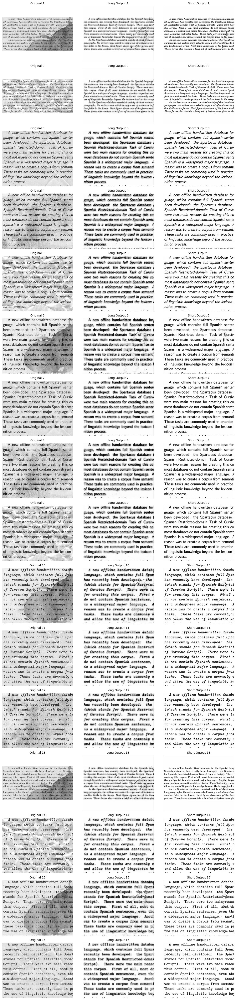

In [33]:
# 모델 초기화
short_model = Autoencoder(encoder, decoder).to(device)
# 모델 학습
train_autoencoder(
	short_model, 
	short_train_loader, # 기본 데이터로 학습
	optimizer=optim.Adam(short_model.parameters(), lr=lr), 
	loss_fn=nn.MSELoss(), 
	epochs=30,
)
# 모델 예측 및 시각화
images, short_outputs = predict_autoencoder(short_model, test_loader)
visualize_outputs(images, outputs, short_outputs, num_images=len(images))